In [111]:
#from google.colab import files
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

## Patients and PRESCRIPTIONS Table

In [112]:
# Load PATIENTS data and PRESCRIPTIONS data
patients_df = pd.read_csv('/Users/balajisethuraman/Mother/UT-Austin/msai/sp25/ai_in_healthcare/mimic-iii-clinical-database-1.4/PATIENTS.csv')
prescriptions_df = pd.read_csv('/Users/balajisethuraman/Mother/UT-Austin/msai/sp25/ai_in_healthcare/mimic-iii-clinical-database-1.4/PRESCRIPTIONS.csv')


/var/folders/53/t0lk0nc97355b8lqtgt3n97h0000gn/T/ipykernel_87973/623006678.py:3: DtypeWarning: Columns (11) have mixed types. Specify dtype option on import or set low_memory=False.
  prescriptions_df = pd.read_csv('/Users/balajisethuraman/Mother/UT-Austin/msai/sp25/ai_in_healthcare/mimic-iii-clinical-database-1.4/PRESCRIPTIONS.csv')


In [113]:
patients_df.head(10)

,ROW_ID,SUBJECT_ID,GENDER,DOB,DOD,DOD_HOSP,DOD_SSN,EXPIRE_FLAG
0,234,249,F,2075-03-13 00:00:00,NaN,NaN,NaN,0
1,235,250,F,2164-12-27 00:00:00,2188-11-22 00:00:00,2188-11-22 00:00:00,NaN,1
2,236,251,M,2090-03-15 00:00:00,NaN,NaN,NaN,0
3,237,252,M,2078-03-06 00:00:00,NaN,NaN,NaN,0
4,238,253,F,2089-11-26 00:00:00,NaN,NaN,NaN,0
5,239,255,M,2109-08-05 00:00:00,NaN,NaN,NaN,0
6,240,256,M,2086-07-31 00:00:00,NaN,NaN,NaN,0
7,241,257,F,2031-04-03 00:00:00,2121-07-08 00:00:00,2121-07-08 00:00:00,2121-07-08 00:00:00,1
8,242,258,F,2124-09-19 00:00:00,NaN,NaN,NaN,0
9,243,260,F,2105-03-23 00:00:00,NaN,NaN,NaN,0


In [114]:
prescriptions_df.head(10)

,ROW_ID,SUBJECT_ID,HADM_ID,ICUSTAY_ID,STARTDATE,ENDDATE,DRUG_TYPE,DRUG,DRUG_NAME_POE,DRUG_NAME_GENERIC,FORMULARY_DRUG_CD,GSN,NDC,PROD_STRENGTH,DOSE_VAL_RX,DOSE_UNIT_RX,FORM_VAL_DISP,FORM_UNIT_DISP,ROUTE
0,2214776,6,107064,NaN,2175-06-11 00:00:00,2175-06-12 00:00:00,MAIN,Tacrolimus,Tacrolimus,Tacrolimus,TACR1,021796,469061711.0,1mg Capsule,2,mg,2,CAP,PO
1,2214775,6,107064,NaN,2175-06-11 00:00:00,2175-06-12 00:00:00,MAIN,Warfarin,Warfarin,Warfarin,WARF5,006562,56017275.0,5mg Tablet,5,mg,1,TAB,PO
2,2215524,6,107064,NaN,2175-06-11 00:00:00,2175-06-12 00:00:00,MAIN,Heparin Sodium,NaN,NaN,HEPAPREMIX,006522,338055002.0,"25,000 unit Premix Bag","25,000",UNIT,1,BAG,IV
3,2216265,6,107064,NaN,2175-06-11 00:00:00,2175-06-12 00:00:00,BASE,D5W,NaN,NaN,HEPBASE,NaN,0.0,HEPARIN BASE,250,ml,250,ml,IV
4,2214773,6,107064,NaN,2175-06-11 00:00:00,2175-06-12 00:00:00,MAIN,Furosemide,Furosemide,Furosemide,FURO20,008208,54829725.0,20mg Tablet,20,mg,1,TAB,PO
5,2214774,6,107064,NaN,2175-06-11 00:00:00,2175-06-15 00:00:00,MAIN,Warfarin,Warfarin,Warfarin,WARF0,014198,56016975.0,Check with MD for Dose,1,dose,1,dose,PO
6,2215525,6,107064,NaN,2175-06-12 00:00:00,2175-06-12 00:00:00,MAIN,Heparin Sodium,NaN,NaN,HEPAPREMIX,006522,338055002.0,"25,000 unit Premix Bag","25,000",UNIT,1,BAG,IV
7,2216266,6,107064,NaN,2175-06-12 00:00:00,2175-06-12 00:00:00,BASE,D5W,NaN,NaN,HEPBASE,NaN,0.0,HEPARIN BASE,250,ml,250,ml,IV
8,2215526,6,107064,NaN,2175-06-12 00:00:00,2175-06-13 00:00:00,MAIN,Heparin Sodium,NaN,NaN,HEPAPREMIX,006522,338055002.0,"25,000 unit Premix Bag","25,000",UNIT,1,BAG,IV
9,2214778,6,107064,NaN,2175-06-12 00:00:00,2175-06-13 00:00:00,MAIN,Warfarin,Warfarin,Warfarin,WARF2,006561,56017075.0,2mg Tab,2,mg,1,TAB,PO


In [115]:
# Preprocess the data
# Convert dates
patients_df['dob'] = pd.to_datetime(patients_df['DOB'])
patients_df['dod'] = pd.to_datetime(patients_df['DOD'])
patients_df['dod_hosp'] = pd.to_datetime(patients_df['DOD_HOSP'])

In [116]:
from datetime import datetime
# Calculate age function
def calculate_age(dob, dod):
    print(dob)
    print(dod)
    # Check if DOB or DOD is NaN
    if pd.isna(dob) or pd.isna(dod):
        return np.nan  # or return None if you prefer
    
    dob_date = datetime.strptime(str(dob), "%Y-%m-%d %H:%M:%S")
    dod_date = datetime.strptime(str(dod), "%Y-%m-%d %H:%M:%S")
    age = (dod_date - dob_date).days // 365
    return age

# Apply calculate_age function to create "age" column
patients_df["age"] = patients_df.apply(lambda row: calculate_age(row["DOB"], row["DOD"]), axis=1)

# Filter out rows with age greater than or equal to 120
filtered_df = patients_df[patients_df["age"] < 120]

2075-03-13 00:00:00
nan
2164-12-27 00:00:00
2188-11-22 00:00:00
2090-03-15 00:00:00
nan
2078-03-06 00:00:00
nan
2089-11-26 00:00:00
nan
2109-08-05 00:00:00
nan
2086-07-31 00:00:00
nan
2031-04-03 00:00:00
2121-07-08 00:00:00
2124-09-19 00:00:00
nan
2105-03-23 00:00:00
nan
2025-08-04 00:00:00
2102-06-29 00:00:00
2090-01-05 00:00:00
nan
2104-06-18 00:00:00
2168-06-13 00:00:00
2162-11-30 00:00:00
nan
2093-08-01 00:00:00
nan
2090-12-17 00:00:00
nan
2131-09-05 00:00:00
nan
2132-02-21 00:00:00
2198-02-18 00:00:00
2130-09-30 00:00:00
nan
2048-05-26 00:00:00
nan
2086-05-12 00:00:00
nan
2097-04-12 00:00:00
2179-04-03 00:00:00
2052-05-20 00:00:00
2120-02-04 00:00:00
2069-08-26 00:00:00
2139-11-20 00:00:00
2053-09-17 00:00:00
nan
2096-08-18 00:00:00
2183-07-10 00:00:00
2121-10-20 00:00:00
2182-07-31 00:00:00
2080-09-30 00:00:00
2161-02-15 00:00:00
2148-03-27 00:00:00
nan
2152-10-21 00:00:00
nan
2122-04-04 00:00:00
nan
2113-12-14 00:00:00
2195-02-17 00:00:00
2158-04-05 00:00:00
nan
2103-08-14 00:00

In [117]:
filtered_df.head(10)

,ROW_ID,SUBJECT_ID,GENDER,DOB,DOD,DOD_HOSP,DOD_SSN,EXPIRE_FLAG,dob,dod,dod_hosp,age
1,235,250,F,2164-12-27 00:00:00,2188-11-22 00:00:00,2188-11-22 00:00:00,NaN,1,2164-12-27,2188-11-22,2188-11-22,23.0
7,241,257,F,2031-04-03 00:00:00,2121-07-08 00:00:00,2121-07-08 00:00:00,2121-07-08 00:00:00,1,2031-04-03,2121-07-08,2121-07-08,90.0
10,244,261,M,2025-08-04 00:00:00,2102-06-29 00:00:00,2102-06-29 00:00:00,2102-06-29 00:00:00,1,2025-08-04,2102-06-29,2102-06-29,76.0
12,246,263,M,2104-06-18 00:00:00,2168-06-13 00:00:00,2168-06-13 00:00:00,NaN,1,2104-06-18,2168-06-13,2168-06-13,64.0
17,251,268,F,2132-02-21 00:00:00,2198-02-18 00:00:00,2198-02-18 00:00:00,NaN,1,2132-02-21,2198-02-18,2198-02-18,66.0
21,627,664,F,2097-04-12 00:00:00,2179-04-03 00:00:00,NaN,2179-04-03 00:00:00,1,2097-04-12,2179-04-03,NaT,82.0
22,628,665,M,2052-05-20 00:00:00,2120-02-04 00:00:00,2120-02-04 00:00:00,NaN,1,2052-05-20,2120-02-04,2120-02-04,67.0
23,629,666,F,2069-08-26 00:00:00,2139-11-20 00:00:00,NaN,2139-11-20 00:00:00,1,2069-08-26,2139-11-20,NaT,70.0
25,631,668,F,2096-08-18 00:00:00,2183-07-10 00:00:00,2183-07-10 00:00:00,2183-07-10 00:00:00,1,2096-08-18,2183-07-10,2183-07-10,86.0
26,632,669,M,2121-10-20 00:00:00,2182-07-31 00:00:00,2182-07-31 00:00:00,2182-07-31 00:00:00,1,2121-10-20,2182-07-31,2182-07-31,60.0


In [118]:
# Merge patients and prescriptions on subject_id
merged_df = pd.merge(filtered_df, prescriptions_df, on='SUBJECT_ID', how='inner')

In [119]:
merged_df.head(10)

,ROW_ID_x,SUBJECT_ID,GENDER,DOB,DOD,DOD_HOSP,DOD_SSN,EXPIRE_FLAG,dob,dod,...,DRUG_NAME_GENERIC,FORMULARY_DRUG_CD,GSN,NDC,PROD_STRENGTH,DOSE_VAL_RX,DOSE_UNIT_RX,FORM_VAL_DISP,FORM_UNIT_DISP,ROUTE
0,235,250,F,2164-12-27 00:00:00,2188-11-22 00:00:00,2188-11-22 00:00:00,NaN,1,2164-12-27,2188-11-22,...,NaN,KCL40I,001255,7.466530e+07,2mEq/ml-20ml,40,mEq,20,ml,IV
1,235,250,F,2164-12-27 00:00:00,2188-11-22 00:00:00,2188-11-22 00:00:00,NaN,1,2164-12-27,2188-11-22,...,NaN,HEPBASE,NaN,0.000000e+00,HEPARIN BASE,250,ml,250,ml,IV
2,235,250,F,2164-12-27 00:00:00,2188-11-22 00:00:00,2188-11-22 00:00:00,NaN,1,2164-12-27,2188-11-22,...,NaN,D5W250,001972,3.380017e+08,250mL Bag,250,ml,250,ml,IV DRIP
3,235,250,F,2164-12-27 00:00:00,2188-11-22 00:00:00,2188-11-22 00:00:00,NaN,1,2164-12-27,2188-11-22,...,NaN,NITP50I,019652,7.430240e+07,25mg/mL-2mL,50,mg,2,ml,IV DRIP
4,235,250,F,2164-12-27 00:00:00,2188-11-22 00:00:00,2188-11-22 00:00:00,NaN,1,2164-12-27,2188-11-22,...,NaN,ESMOBASE,NaN,0.000000e+00,250ml Bag,250,ml,250,ml,IV
5,235,250,F,2164-12-27 00:00:00,2188-11-22 00:00:00,2188-11-22 00:00:00,NaN,1,2164-12-27,2188-11-22,...,NaN,ESMO2.5PM,048856,1.001901e+10,2.5g Bag,2.5,gm,1,BAG,IV
6,235,250,F,2164-12-27 00:00:00,2188-11-22 00:00:00,2188-11-22 00:00:00,NaN,1,2164-12-27,2188-11-22,...,NaN,D5W250,001972,3.380017e+08,250mL Bag,250,ml,250,ml,IV DRIP
7,235,250,F,2164-12-27 00:00:00,2188-11-22 00:00:00,2188-11-22 00:00:00,NaN,1,2164-12-27,2188-11-22,...,NaN,D5W50,001972,3.380017e+08,50mL Bag,50,ml,50,ml,IV DRIP
8,235,250,F,2164-12-27 00:00:00,2188-11-22 00:00:00,2188-11-22 00:00:00,NaN,1,2164-12-27,2188-11-22,...,NaN,MIDA50I,003780,1.001900e+10,50mg/10mL Vial,50,mg,10,ml,IV DRIP
9,235,250,F,2164-12-27 00:00:00,2188-11-22 00:00:00,2188-11-22 00:00:00,NaN,1,2164-12-27,2188-11-22,...,NaN,FENT50I,041385,1.001900e+10,2500mcg/50mL Vial,2500,mcg,1,VIAL,IV DRIP


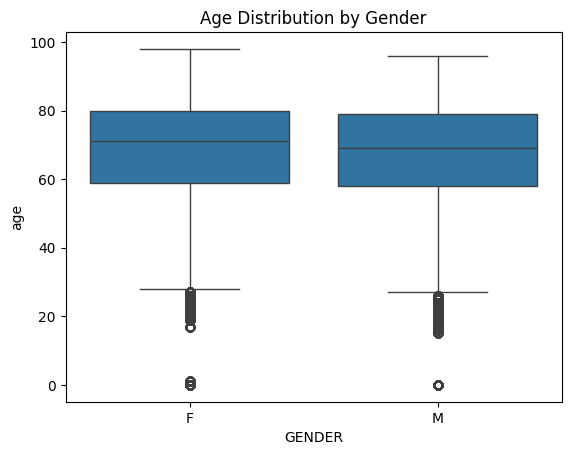

In [120]:
# Boxplot: Age Distribution by Gender
sns.boxplot(x='GENDER', y='age', data=merged_df)
plt.title('Age Distribution by Gender')
plt.show()

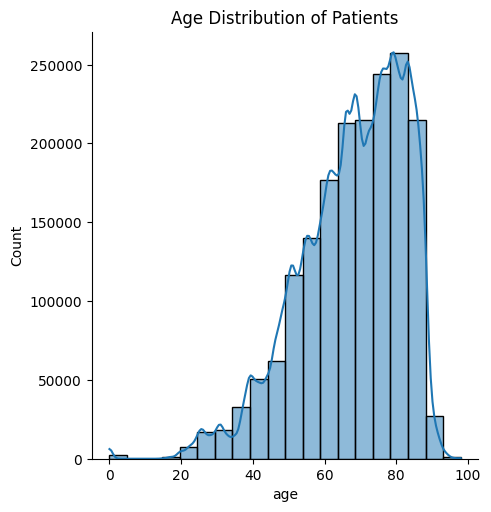

In [121]:
# Displot: Distribution of Patient Ages
sns.displot(merged_df['age'], kde=True, bins=20)
plt.title('Age Distribution of Patients')
plt.show()


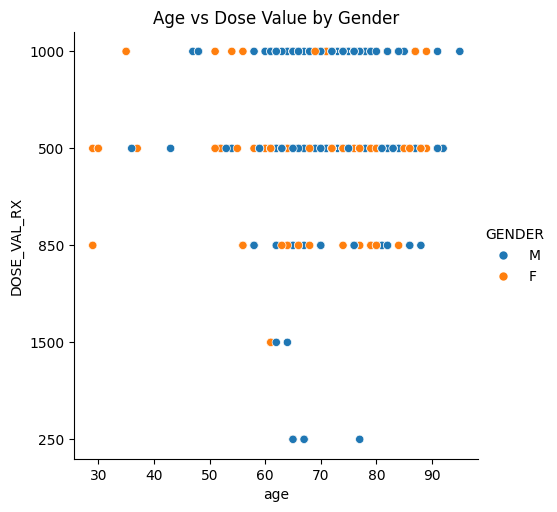

In [122]:
# Relplot: Relationship Between Age and Dose with Gender Hue
drug_data = merged_df[merged_df['DRUG'] == 'Metformin']  # Example: Metformin
sns.relplot(x='age', y='DOSE_VAL_RX', hue='GENDER', data=drug_data)
plt.title('Age vs Dose Value by Gender')
plt.show()

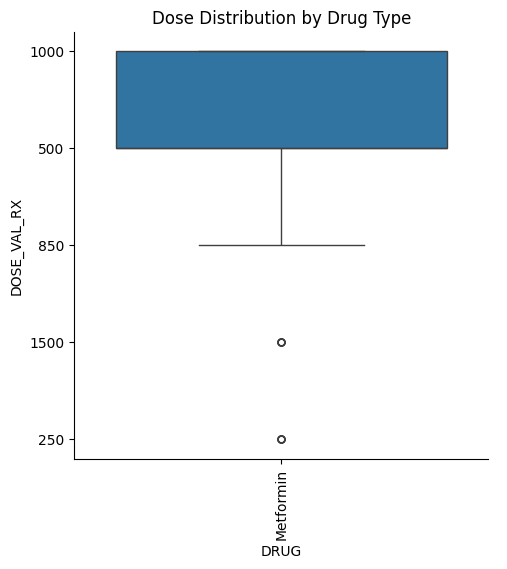

In [123]:
# Catplot: Dose Distribution by Drug Type
drug_data = merged_df[merged_df['DRUG'] == 'Metformin']  # Example: Metformin
sns.catplot(x='DRUG', y='DOSE_VAL_RX', data=drug_data, kind='box')
plt.title('Dose Distribution by Drug Type')
plt.xticks(rotation=90)  # Rotate drug names for better readability
plt.show()

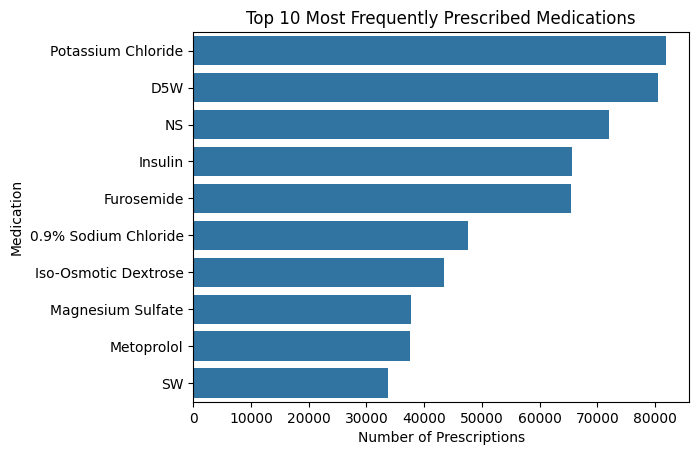

In [124]:
# Top 10 Most Frequently Prescribed Medications
top_medications = merged_df['DRUG'].value_counts().head(10)
sns.barplot(x=top_medications.values, y=top_medications.index)
plt.title('Top 10 Most Frequently Prescribed Medications')
plt.xlabel('Number of Prescriptions')
plt.ylabel('Medication')
plt.show()

## Patients and MICROBIOLOGYEVENTS Table

In [125]:
# Load PATIENTS data and MICROBIOLOGYEVENTS data
patients_df_1 = pd.read_csv('/Users/balajisethuraman/Mother/UT-Austin/msai/sp25/ai_in_healthcare/mimic-iii-clinical-database-1.4/PATIENTS.csv')
microbiologyevents_df = pd.read_csv('/Users/balajisethuraman/Mother/UT-Austin/msai/sp25/ai_in_healthcare/mimic-iii-clinical-database-1.4/MICROBIOLOGYEVENTS.csv')

In [126]:
microbiologyevents_df.head(10)

,ROW_ID,SUBJECT_ID,HADM_ID,CHARTDATE,CHARTTIME,SPEC_ITEMID,SPEC_TYPE_DESC,ORG_ITEMID,ORG_NAME,ISOLATE_NUM,AB_ITEMID,AB_NAME,DILUTION_TEXT,DILUTION_COMPARISON,DILUTION_VALUE,INTERPRETATION
0,744,96,170324,2156-04-13 00:00:00,2156-04-13 14:18:00,70021.0,BRONCHOALVEOLAR LAVAGE,80026.0,PSEUDOMONAS AERUGINOSA,1.0,NaN,NaN,NaN,NaN,NaN,NaN
1,745,96,170324,2156-04-20 00:00:00,2156-04-20 13:10:00,70062.0,SPUTUM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,746,96,170324,2156-04-20 00:00:00,2156-04-20 16:00:00,70012.0,BLOOD CULTURE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,747,96,170324,2156-04-20 00:00:00,NaN,70012.0,BLOOD CULTURE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,748,96,170324,2156-04-20 00:00:00,NaN,70079.0,URINE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,749,96,170324,2156-04-21 00:00:00,2156-04-21 14:00:00,70062.0,SPUTUM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,750,101,175533,2196-09-26 00:00:00,NaN,70079.0,URINE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,751,101,175533,2196-09-27 00:00:00,2196-09-27 00:00:00,70012.0,BLOOD CULTURE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,752,101,175533,2196-09-27 00:00:00,2196-09-27 00:00:00,70012.0,BLOOD CULTURE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,753,101,175533,2196-09-27 00:00:00,2196-09-27 00:00:00,70062.0,SPUTUM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [127]:
# Preprocess the data
# Convert dates
patients_df_1['dob'] = pd.to_datetime(patients_df['DOB'])
patients_df_1['dod'] = pd.to_datetime(patients_df['DOD'])
patients_df_1['dod_hosp'] = pd.to_datetime(patients_df['DOD_HOSP'])

In [128]:
from datetime import datetime
# Calculate age function
def calculate_age(dob, dod):
    print(dob)
    print(dod)
    # Check if DOB or DOD is NaN
    if pd.isna(dob) or pd.isna(dod):
        return np.nan  # or return None if you prefer
    
    dob_date = datetime.strptime(str(dob), "%Y-%m-%d %H:%M:%S")
    dod_date = datetime.strptime(str(dod), "%Y-%m-%d %H:%M:%S")
    age = (dod_date - dob_date).days // 365
    return age

# Apply calculate_age function to create "age" column
patients_df_1["age"] = patients_df_1.apply(lambda row: calculate_age(row["DOB"], row["DOD"]), axis=1)

# Filter out rows with age greater than or equal to 120
filtered_df_1 = patients_df_1[patients_df_1["age"] < 120]

2075-03-13 00:00:00
nan
2164-12-27 00:00:00
2188-11-22 00:00:00
2090-03-15 00:00:00
nan
2078-03-06 00:00:00
nan
2089-11-26 00:00:00
nan
2109-08-05 00:00:00
nan
2086-07-31 00:00:00
nan
2031-04-03 00:00:00
2121-07-08 00:00:00
2124-09-19 00:00:00
nan
2105-03-23 00:00:00
nan
2025-08-04 00:00:00
2102-06-29 00:00:00
2090-01-05 00:00:00
nan
2104-06-18 00:00:00
2168-06-13 00:00:00
2162-11-30 00:00:00
nan
2093-08-01 00:00:00
nan
2090-12-17 00:00:00
nan
2131-09-05 00:00:00
nan
2132-02-21 00:00:00
2198-02-18 00:00:00
2130-09-30 00:00:00
nan
2048-05-26 00:00:00
nan
2086-05-12 00:00:00
nan
2097-04-12 00:00:00
2179-04-03 00:00:00
2052-05-20 00:00:00
2120-02-04 00:00:00
2069-08-26 00:00:00
2139-11-20 00:00:00
2053-09-17 00:00:00
nan
2096-08-18 00:00:00
2183-07-10 00:00:00
2121-10-20 00:00:00
2182-07-31 00:00:00
2080-09-30 00:00:00
2161-02-15 00:00:00
2148-03-27 00:00:00
nan
2152-10-21 00:00:00
nan
2122-04-04 00:00:00
nan
2113-12-14 00:00:00
2195-02-17 00:00:00
2158-04-05 00:00:00
nan
2103-08-14 00:00

In [129]:
# Merge patients and microbiologyevents on subject_id
merged_df_1 = pd.merge(filtered_df_1, microbiologyevents_df, on='SUBJECT_ID', how='inner')

In [130]:
merged_df_1['CHARTTIME'] = pd.to_datetime(merged_df_1['CHARTTIME'])
merged_df_1['YEAR'] = merged_df_1['CHARTTIME'].dt.year

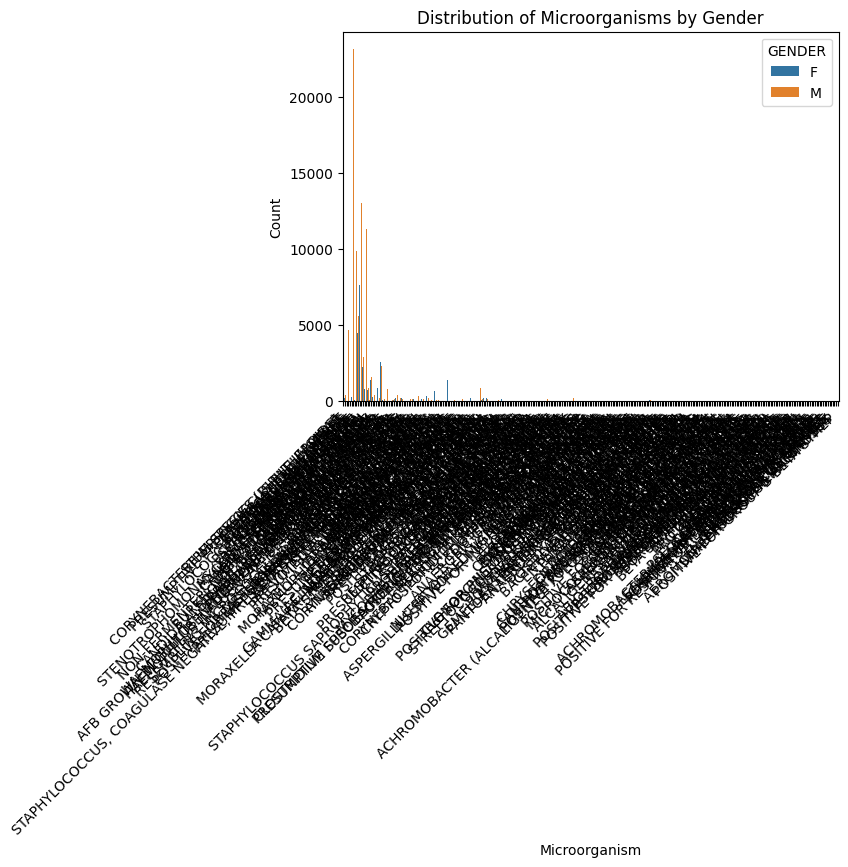

In [131]:
# 1. Distribution of microorganisms by gender
sns.countplot(x='ORG_NAME', hue='GENDER', data=merged_df_1)
plt.title('Distribution of Microorganisms by Gender')
plt.xlabel('Microorganism')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.show()

In [ ]:
# Fetch first 25 columns
merged_df_1_top25 = merged_df_1.head(25) 

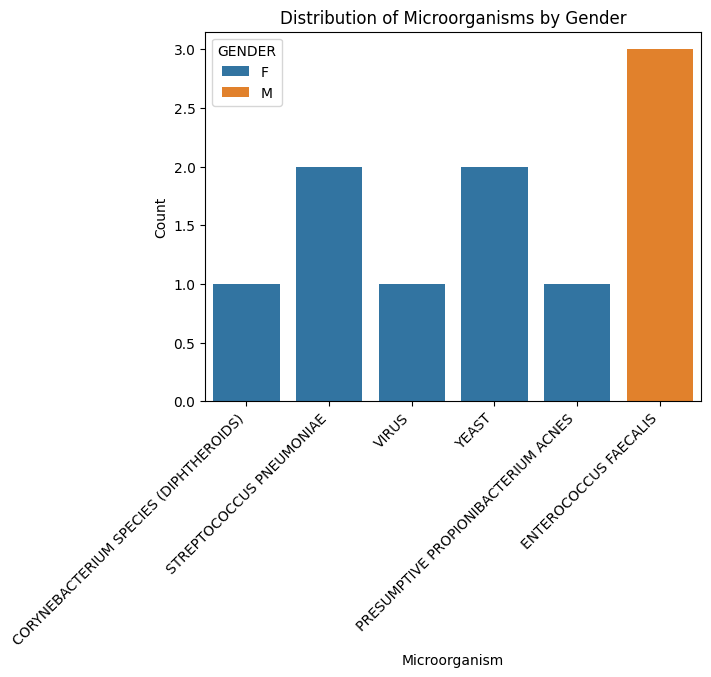

In [162]:
# 1.1 Distribution of microorganisms by gender. Fetching first 25 columns
sns.countplot(x='ORG_NAME', hue='GENDER', data=merged_df_1_top25)
plt.title('Distribution of Microorganisms by Gender')
plt.xlabel('Microorganism')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.show()

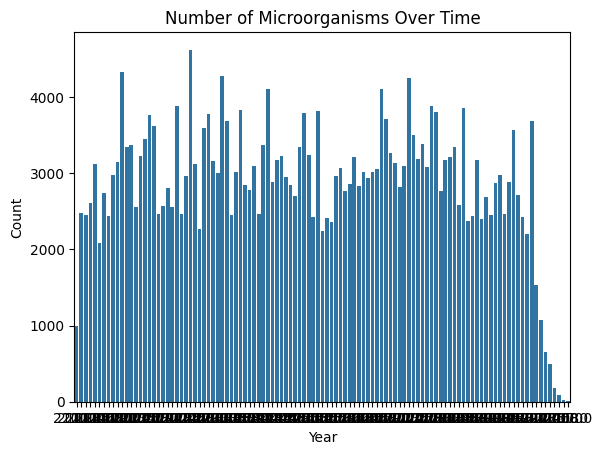

In [132]:
# 2. Number of microorganisms over time (by year)
sns.countplot(x='YEAR', data=merged_df_1)
plt.title('Number of Microorganisms Over Time')
plt.xlabel('Year')
plt.ylabel('Count')
plt.show()

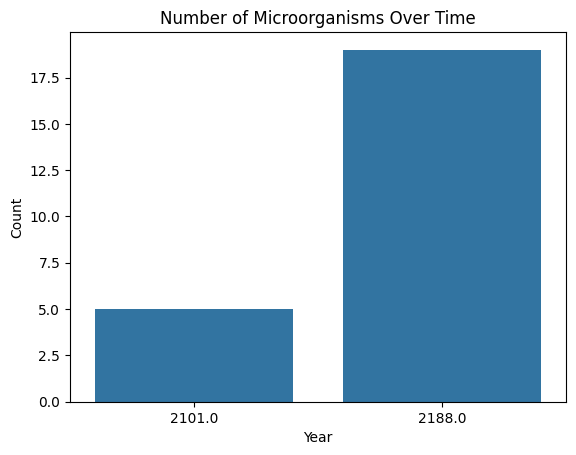

In [163]:
# 2.1 Number of microorganisms over time (by year). Fetch first 25 columns
sns.countplot(x='YEAR', data=merged_df_1_top25)
plt.title('Number of Microorganisms Over Time')
plt.xlabel('Year')
plt.ylabel('Count')
plt.show()

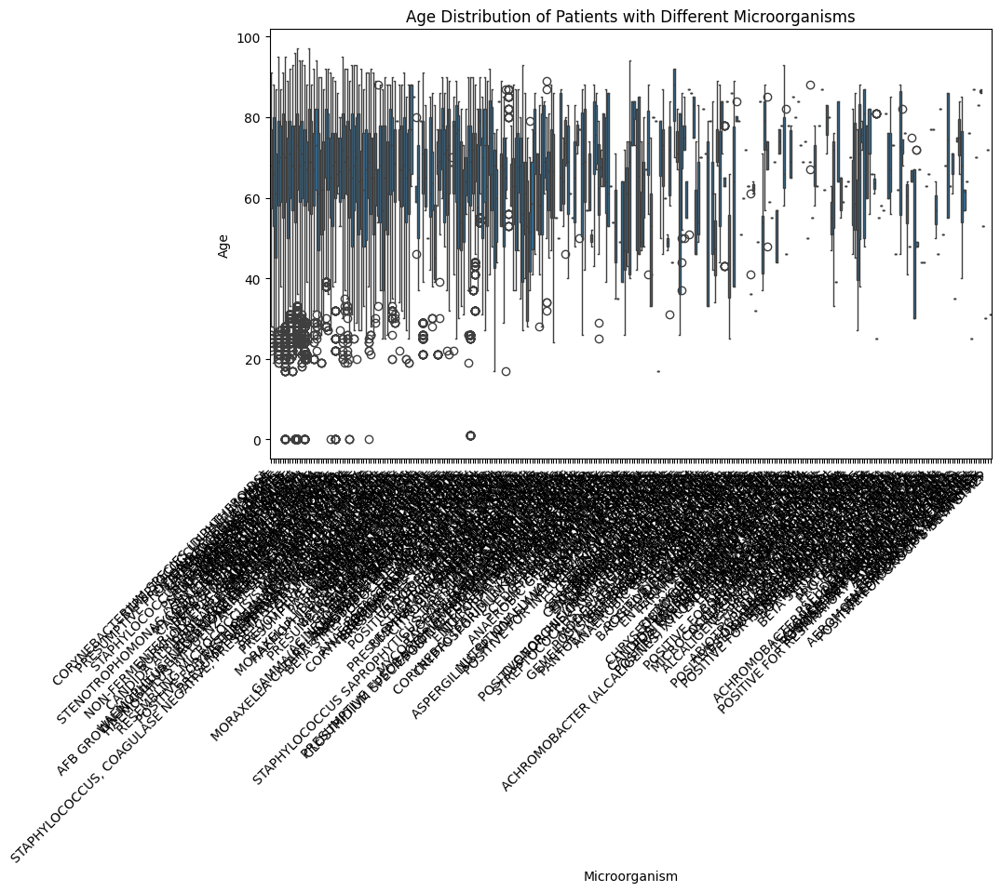

In [133]:
# Age distribution of patients with different microorganisms
plt.figure(figsize=(10, 6))
sns.boxplot(x='ORG_NAME', y='age', data=merged_df_1)
plt.title('Age Distribution of Patients with Different Microorganisms')
plt.xlabel('Microorganism')
plt.ylabel('Age')
plt.xticks(rotation=45, ha='right')
plt.show()

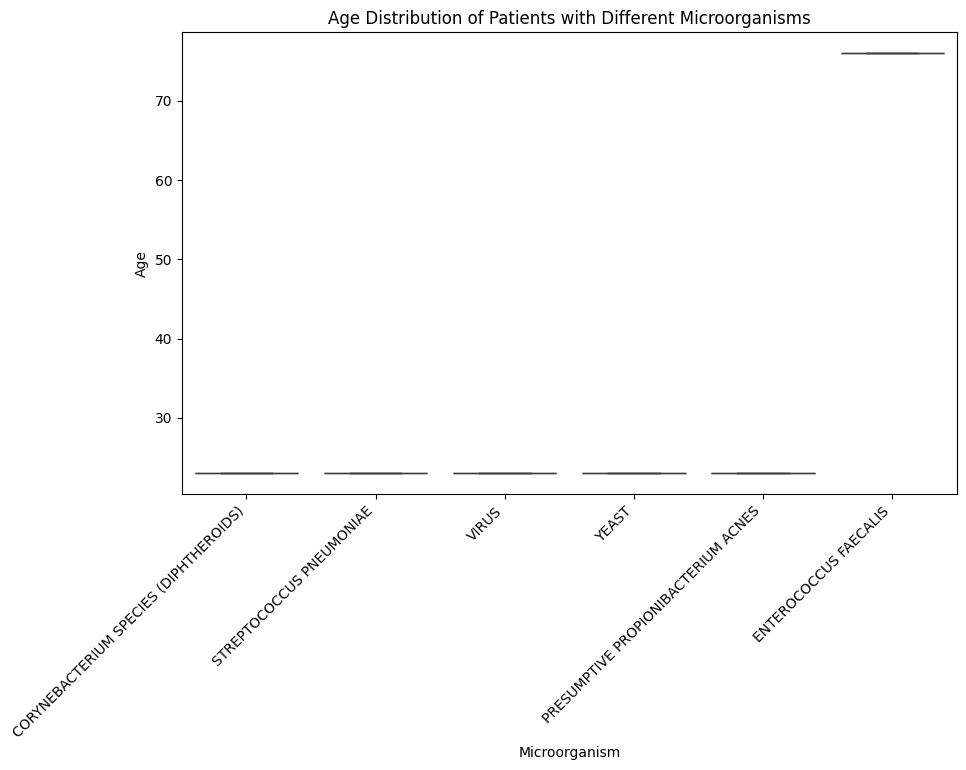

In [164]:
# Age distribution of patients with different microorganisms. Fetch first 25 columns
plt.figure(figsize=(10, 6))
sns.boxplot(x='ORG_NAME', y='age', data=merged_df_1_top25)
plt.title('Age Distribution of Patients with Different Microorganisms')
plt.xlabel('Microorganism')
plt.ylabel('Age')
plt.xticks(rotation=45, ha='right')
plt.show()

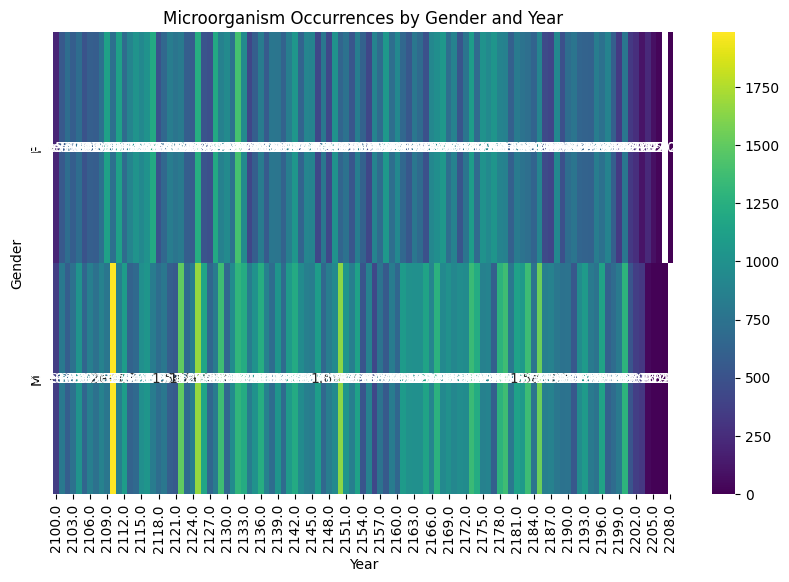

In [134]:
# 4. Heatmap of microorganism occurrences by gender and year
heatmap_data = pd.crosstab(merged_df_1['GENDER'], merged_df_1['YEAR'], values=merged_df_1['ORG_NAME'], aggfunc='count')
plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data, annot=True, cmap='viridis')
plt.title('Microorganism Occurrences by Gender and Year')
plt.xlabel('Year')
plt.ylabel('Gender')
plt.show()

## Patients and SERVICES Table

In [135]:
# Load PATIENTS data and MICROBIOLOGYEVENTS data
patients_df_2 = pd.read_csv('/Users/balajisethuraman/Mother/UT-Austin/msai/sp25/ai_in_healthcare/mimic-iii-clinical-database-1.4/PATIENTS.csv')
services_df = pd.read_csv('/Users/balajisethuraman/Mother/UT-Austin/msai/sp25/ai_in_healthcare/mimic-iii-clinical-database-1.4/SERVICES.csv')

In [136]:
from datetime import datetime
# Calculate age function
def calculate_age(dob, dod):
    print(dob)
    print(dod)
    # Check if DOB or DOD is NaN
    if pd.isna(dob) or pd.isna(dod):
        return np.nan  # or return None if you prefer
    
    dob_date = datetime.strptime(str(dob), "%Y-%m-%d %H:%M:%S")
    dod_date = datetime.strptime(str(dod), "%Y-%m-%d %H:%M:%S")
    age = (dod_date - dob_date).days // 365
    return age

# Apply calculate_age function to create "age" column
patients_df_2["age_at_death"] = patients_df_2.apply(lambda row: calculate_age(row["DOB"], row["DOD"]), axis=1)

# Filter out rows with age greater than or equal to 120
filtered_df_2 = patients_df_2[patients_df_2["age_at_death"] < 120]

2075-03-13 00:00:00
nan
2164-12-27 00:00:00
2188-11-22 00:00:00
2090-03-15 00:00:00
nan
2078-03-06 00:00:00
nan
2089-11-26 00:00:00
nan
2109-08-05 00:00:00
nan
2086-07-31 00:00:00
nan
2031-04-03 00:00:00
2121-07-08 00:00:00
2124-09-19 00:00:00
nan
2105-03-23 00:00:00
nan
2025-08-04 00:00:00
2102-06-29 00:00:00
2090-01-05 00:00:00
nan
2104-06-18 00:00:00
2168-06-13 00:00:00
2162-11-30 00:00:00
nan
2093-08-01 00:00:00
nan
2090-12-17 00:00:00
nan
2131-09-05 00:00:00
nan
2132-02-21 00:00:00
2198-02-18 00:00:00
2130-09-30 00:00:00
nan
2048-05-26 00:00:00
nan
2086-05-12 00:00:00
nan
2097-04-12 00:00:00
2179-04-03 00:00:00
2052-05-20 00:00:00
2120-02-04 00:00:00
2069-08-26 00:00:00
2139-11-20 00:00:00
2053-09-17 00:00:00
nan
2096-08-18 00:00:00
2183-07-10 00:00:00
2121-10-20 00:00:00
2182-07-31 00:00:00
2080-09-30 00:00:00
2161-02-15 00:00:00
2148-03-27 00:00:00
nan
2152-10-21 00:00:00
nan
2122-04-04 00:00:00
nan
2113-12-14 00:00:00
2195-02-17 00:00:00
2158-04-05 00:00:00
nan
2103-08-14 00:00

In [137]:
# Merge the tables based on 'subject_id'
merged_df_2 = pd.merge(filtered_df_2, services_df, on='SUBJECT_ID', how='inner')

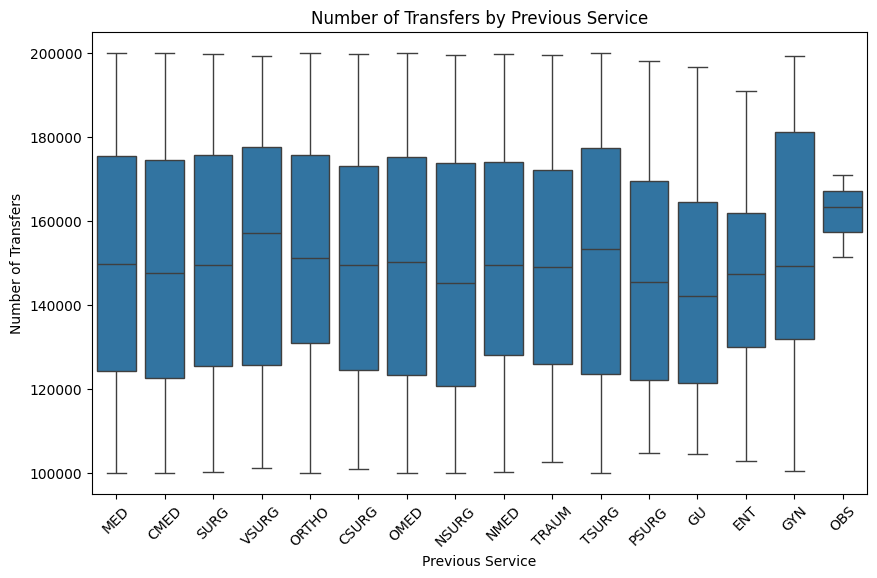

In [139]:
# Boxplot: Number of Transfers by Previous Service
plt.figure(figsize=(10, 6))
sns.boxplot(x='PREV_SERVICE', y='HADM_ID', data=merged_df_2)
plt.title('Number of Transfers by Previous Service')
plt.xlabel('Previous Service')
plt.ylabel('Number of Transfers')
plt.xticks(rotation=45)
plt.show()

<Figure size 1000x600 with 0 Axes>

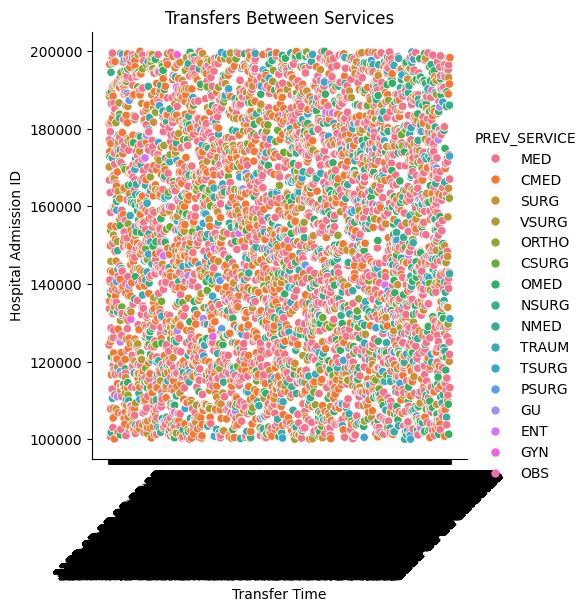

In [140]:
# Relplot: Scatter plot for Transfers between Services
plt.figure(figsize=(10, 6))
sns.relplot(x='TRANSFERTIME', y='HADM_ID', data=merged_df_2, hue='PREV_SERVICE', kind='scatter')
plt.title('Transfers Between Services')
plt.xlabel('Transfer Time')
plt.ylabel('Hospital Admission ID')
plt.xticks(rotation=45)
plt.show()

In [143]:
merged_df_2.head(10)

,ROW_ID_x,SUBJECT_ID,GENDER,DOB,DOD,DOD_HOSP,DOD_SSN,EXPIRE_FLAG,age_at_death,ROW_ID_y,HADM_ID,TRANSFERTIME,PREV_SERVICE,CURR_SERVICE
0,235,250,F,2164-12-27 00:00:00,2188-11-22 00:00:00,2188-11-22 00:00:00,NaN,1,23.0,414,124271,2188-11-12 09:25:47,NaN,MED
1,235,250,F,2164-12-27 00:00:00,2188-11-22 00:00:00,2188-11-22 00:00:00,NaN,1,23.0,415,124271,2188-11-14 13:58:11,MED,CSURG
2,241,257,F,2031-04-03 00:00:00,2121-07-08 00:00:00,2121-07-08 00:00:00,2121-07-08 00:00:00,1,90.0,427,179006,2112-12-20 20:46:05,NaN,NSURG
3,244,261,M,2025-08-04 00:00:00,2102-06-29 00:00:00,2102-06-29 00:00:00,2102-06-29 00:00:00,1,76.0,430,118523,2101-12-27 01:50:00,NaN,MED
4,246,263,M,2104-06-18 00:00:00,2168-06-13 00:00:00,2168-06-13 00:00:00,NaN,1,64.0,432,120845,2160-01-09 19:30:58,NaN,VSURG
5,251,268,F,2132-02-21 00:00:00,2198-02-18 00:00:00,2198-02-18 00:00:00,NaN,1,66.0,438,110404,2198-02-11 13:42:38,NaN,MED
6,627,664,F,2097-04-12 00:00:00,2179-04-03 00:00:00,NaN,2179-04-03 00:00:00,1,82.0,1027,181314,2179-02-10 11:32:00,NaN,CMED
7,627,664,F,2097-04-12 00:00:00,2179-04-03 00:00:00,NaN,2179-04-03 00:00:00,1,82.0,1028,181314,2179-02-15 18:24:00,CMED,CSURG
8,628,665,M,2052-05-20 00:00:00,2120-02-04 00:00:00,2120-02-04 00:00:00,NaN,1,67.0,1029,126226,2114-07-05 15:52:41,NaN,CMED
9,628,665,M,2052-05-20 00:00:00,2120-02-04 00:00:00,2120-02-04 00:00:00,NaN,1,67.0,1030,152089,2119-02-25 20:14:11,NaN,MED


<Figure size 1000x600 with 0 Axes>

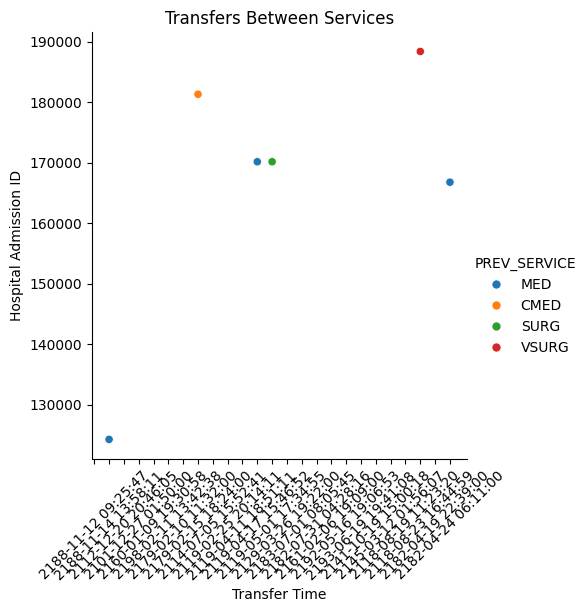

In [153]:
# Limit to first 25 columns for the plot
merged_df_2_top25 = merged_df_2.head(25)

# Now use this filtered DataFrame in the plot
plt.figure(figsize=(10, 6))
sns.relplot(x='TRANSFERTIME', y='HADM_ID', data=merged_df_2_top25, hue='PREV_SERVICE', kind='scatter')
plt.title('Transfers Between Services')
plt.xlabel('Transfer Time')
plt.ylabel('Hospital Admission ID')
plt.xticks(rotation=45)
plt.show()

In [ ]:
# Catplot: Count of Transfers by Previous Service
plt.figure(figsize=(10, 6))
sns.catplot(x='PREV_SERVICE', data=merged_df_2, kind='count', height=6, aspect=2)
plt.title('Count of Transfers by Previous Service')
plt.xlabel('Previous Service')
plt.ylabel('Count of Transfers')
plt.xticks(rotation=45)
plt.show()

## Patients and TRANSFERS Table

In [154]:
# Load PATIENTS data and TRANSFERS data
patients_df_3 = pd.read_csv('/Users/balajisethuraman/Mother/UT-Austin/msai/sp25/ai_in_healthcare/mimic-iii-clinical-database-1.4/PATIENTS.csv')
transfers_df = pd.read_csv('/Users/balajisethuraman/Mother/UT-Austin/msai/sp25/ai_in_healthcare/mimic-iii-clinical-database-1.4/TRANSFERS.csv')

In [155]:
from datetime import datetime
# Calculate age function
def calculate_age(dob, dod):
    print(dob)
    print(dod)
    # Check if DOB or DOD is NaN
    if pd.isna(dob) or pd.isna(dod):
        return np.nan  # or return None if you prefer
    
    dob_date = datetime.strptime(str(dob), "%Y-%m-%d %H:%M:%S")
    dod_date = datetime.strptime(str(dod), "%Y-%m-%d %H:%M:%S")
    age = (dod_date - dob_date).days // 365
    return age

# Apply calculate_age function to create "age" column
patients_df_3["age_at_death"] = patients_df_3.apply(lambda row: calculate_age(row["DOB"], row["DOD"]), axis=1)

# Filter out rows with age greater than or equal to 120
filtered_df_3 = patients_df_3[patients_df_3["age_at_death"] < 120]

2075-03-13 00:00:00
nan
2164-12-27 00:00:00
2188-11-22 00:00:00
2090-03-15 00:00:00
nan
2078-03-06 00:00:00
nan
2089-11-26 00:00:00
nan
2109-08-05 00:00:00
nan
2086-07-31 00:00:00
nan
2031-04-03 00:00:00
2121-07-08 00:00:00
2124-09-19 00:00:00
nan
2105-03-23 00:00:00
nan
2025-08-04 00:00:00
2102-06-29 00:00:00
2090-01-05 00:00:00
nan
2104-06-18 00:00:00
2168-06-13 00:00:00
2162-11-30 00:00:00
nan
2093-08-01 00:00:00
nan
2090-12-17 00:00:00
nan
2131-09-05 00:00:00
nan
2132-02-21 00:00:00
2198-02-18 00:00:00
2130-09-30 00:00:00
nan
2048-05-26 00:00:00
nan
2086-05-12 00:00:00
nan
2097-04-12 00:00:00
2179-04-03 00:00:00
2052-05-20 00:00:00
2120-02-04 00:00:00
2069-08-26 00:00:00
2139-11-20 00:00:00
2053-09-17 00:00:00
nan
2096-08-18 00:00:00
2183-07-10 00:00:00
2121-10-20 00:00:00
2182-07-31 00:00:00
2080-09-30 00:00:00
2161-02-15 00:00:00
2148-03-27 00:00:00
nan
2152-10-21 00:00:00
nan
2122-04-04 00:00:00
nan
2113-12-14 00:00:00
2195-02-17 00:00:00
2158-04-05 00:00:00
nan
2103-08-14 00:00

In [156]:
# Merge the tables based on 'subject_id'
merged_df_3 = pd.merge(filtered_df_3, transfers_df, on='SUBJECT_ID', how='inner')

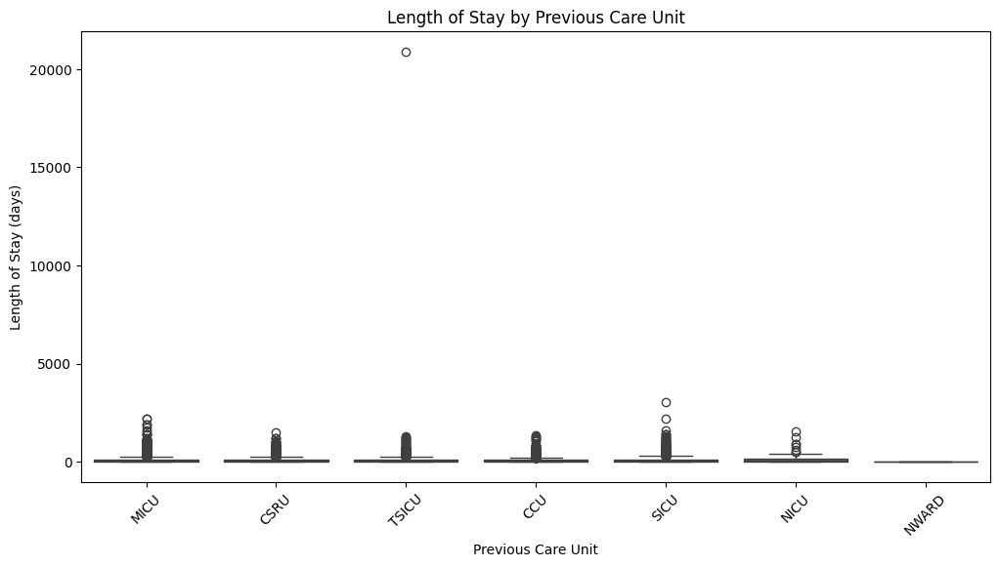

In [157]:
# Boxplot showing Length of Stay by Previous Care Unit
plt.figure(figsize=(12, 6))
sns.boxplot(x='PREV_CAREUNIT', y='LOS', data=merged_df_3)
plt.title('Length of Stay by Previous Care Unit')
plt.xlabel('Previous Care Unit')
plt.ylabel('Length of Stay (days)')
plt.xticks(rotation=45)
plt.show()

<Figure size 1000x600 with 0 Axes>

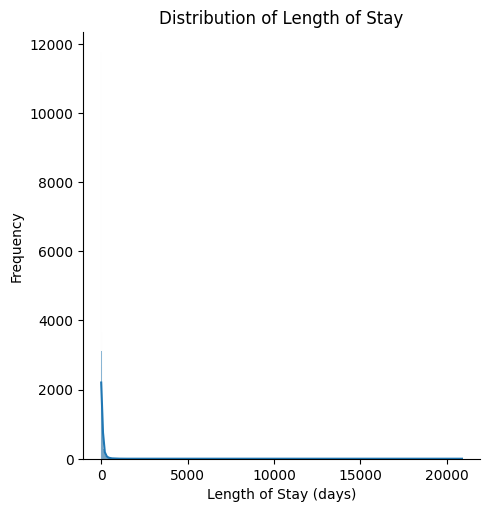

In [158]:
# Distribution of Length of Stay (LOS)
plt.figure(figsize=(10, 6))
sns.displot(merged_df_3['LOS'], kde=True)
plt.title('Distribution of Length of Stay')
plt.xlabel('Length of Stay (days)')
plt.ylabel('Frequency')
plt.show()

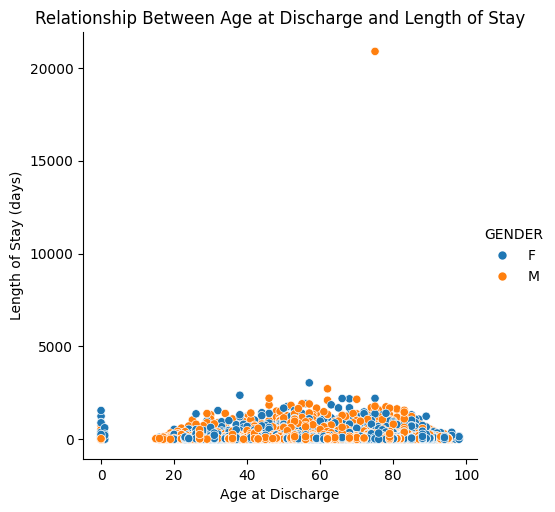

In [159]:


# Relationship Between Age and Length of Stay (LOS)
sns.relplot(x='age_at_death', y='LOS', data=merged_df_3, hue='GENDER', kind='scatter')
plt.title('Relationship Between Age at Discharge and Length of Stay')
plt.xlabel('Age at Discharge')
plt.ylabel('Length of Stay (days)')
plt.show()

<Figure size 1200x600 with 0 Axes>

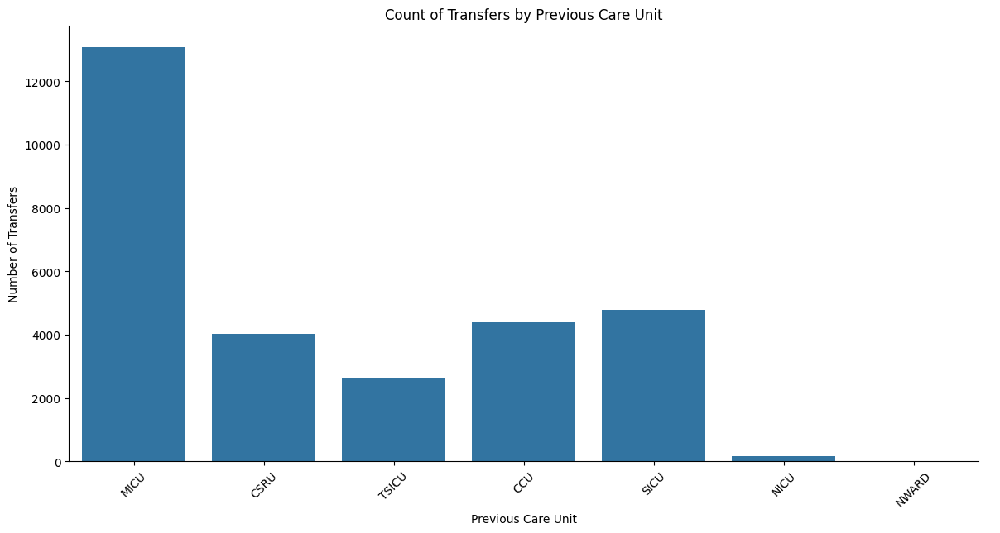

In [160]:
# Count of Transfers by Previous Care Unit
plt.figure(figsize=(12, 6))
sns.catplot(x='PREV_CAREUNIT', data=merged_df_3, kind='count', height=6, aspect=2)
plt.title('Count of Transfers by Previous Care Unit')
plt.xlabel('Previous Care Unit')
plt.ylabel('Number of Transfers')
plt.xticks(rotation=45)
plt.show()

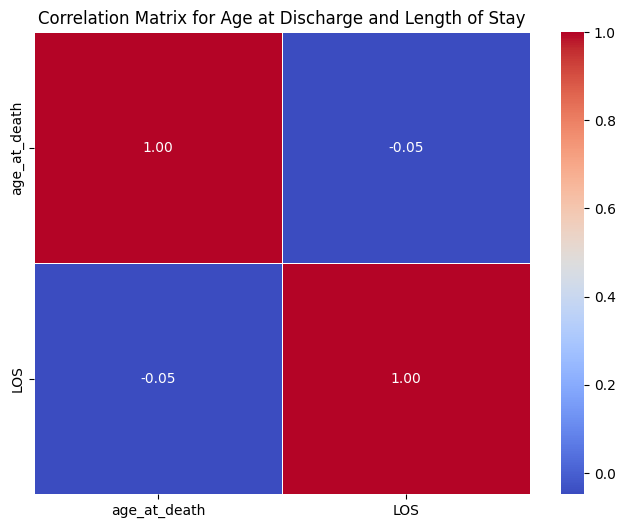

In [161]:
# Heatmap: Correlation Matrix of Numerical Variables
correlation_matrix = merged_df_3[['age_at_death', 'LOS']].corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix for Age at Discharge and Length of Stay')
plt.show()

### **Conclusion**

We analyzed the MIMIC III dataset by taking Patient data in relationship with PRESCRIPTIONS, MICROBIOLOGYEVENTS, SERVICES  and TRANSFERS tables. Below Seaborn visualizions are used
sns.boxplot
sns.displot
sns.lmplot
sns.relplot
sns.catplot
sns.pairplot
